### **<font size=5> Notebook for Object Detection Pipeline** 



In [ ]:
import os
HOME = os.getcwd()
print("HOME:", HOME)
#%cd /mmfs1/gscratch/krishna/danielog/Project_vsg/Grounded-SAM-2

In [4]:
import ipywidgets as widgets
from IPython.display import clear_output, display, Image
import os
import warnings
import torch
import matplotlib.pyplot as plt
import cv2
import torch
import numpy as np
import pickle
import pandas as pd
import json
import copy
from huggingface_hub import hf_hub_download
import matplotlib.pyplot as plt
from PIL import Image
import torchvision.transforms as TS
import torchvision.transforms as transforms
import supervision as sv
from transformers import AutoProcessor, AutoModelForZeroShotObjectDetection
from pathlib import Path
from torchvision.ops import box_convert


import grounding_dino.groundingdino.datasets.transforms as T
from grounding_dino.groundingdino.models import build_model
from grounding_dino.groundingdino.util import box_ops
from grounding_dino.groundingdino.util.inference import load_model, load_image, predict, annotate
from grounding_dino.groundingdino.util.slconfig import SLConfig
from grounding_dino.groundingdino.util.utils import clean_state_dict, get_phrases_from_posmap

from recognizeanything.ram.models import ram
from recognizeanything.ram import inference_ram
from recognizeanything.ram import get_transform

from sam2.build_sam import build_sam2_video_predictor, build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator

from utils.track_utils import sample_points_from_masks
from utils.video_utils import create_video_from_images
from utils.mask_dictionary_model import MaskDictionaryModel, ObjectInfo
from utils.common_utils import CommonUtils

In [5]:
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

ram_model = ram(pretrained='/mmfs1/gscratch/krishna/danielog/Project_vsg/Grounded-SAM-2/recognizeanything/pretrained/ram_swin_large_14m.pth', image_size=384,
                                        vit='swin_l')
ram_model.eval()
model_ram = ram_model.to(DEVICE)


normalize = transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
)

transform = transforms.Compose([
    transforms.Resize((384,384)),
    transforms.ToTensor(),
    normalize
])

BertLMHeadModel has generative capabilities, as `prepare_inputs_for_generation` is explicitly overwritten. However, it doesn't directly inherit from `GenerationMixin`. From 👉v4.50👈 onwards, `PreTrainedModel` will NOT inherit from `GenerationMixin`, and this model will lose the ability to call `generate` and other related functions.
  - If you're using `trust_remote_code=True`, you can get rid of this warning by loading the model with an auto class. See https://huggingface.co/docs/transformers/en/model_doc/auto#auto-classes
  - If you are the owner of the model architecture code, please modify your model class such that it inherits from `GenerationMixin` (after `PreTrainedModel`, otherwise you'll get an exception).
  - If you are not the owner of the model architecture class, please contact the model code owner to update it.


/encoder/layer/0/crossattention/self/query is tied
/encoder/layer/0/crossattention/self/key is tied
/encoder/layer/0/crossattention/self/value is tied
/encoder/layer/0/crossattention/output/dense is tied
/encoder/layer/0/crossattention/output/LayerNorm is tied
/encoder/layer/0/intermediate/dense is tied
/encoder/layer/0/output/dense is tied
/encoder/layer/0/output/LayerNorm is tied
/encoder/layer/1/crossattention/self/query is tied
/encoder/layer/1/crossattention/self/key is tied
/encoder/layer/1/crossattention/self/value is tied
/encoder/layer/1/crossattention/output/dense is tied
/encoder/layer/1/crossattention/output/LayerNorm is tied
/encoder/layer/1/intermediate/dense is tied
/encoder/layer/1/output/dense is tied
/encoder/layer/1/output/LayerNorm is tied
--------------
/mmfs1/gscratch/krishna/danielog/Project_vsg/Grounded-SAM-2/recognizeanything/pretrained/ram_swin_large_14m.pth
--------------
load checkpoint from /mmfs1/gscratch/krishna/danielog/Project_vsg/Grounded-SAM-2/recogni

In [6]:
video_dir = "/mmfs1/gscratch/krishna/danielog/Project_vsg/Grounded-SAM-2/Videos"
frames_folder = "/mmfs1/gscratch/krishna/danielog/Project_vsg/Grounded-SAM-2/Images/"

output_dir = "./outputs"
Image_dir = "./Images"
CommonUtils.creat_dirs(Image_dir)
# if os.path.splitext(p)[-1] in [".MP4", ".mp4"]]

Path './Images' already exists.


In [7]:
# scan all the JPEG frame names in this directory
video_directory = [p for p in os.listdir(video_dir) if os.path.splitext(p)[-1] in [".MP4", ".mp4"]]

for video in video_directory:
    video_name = video.split(".")[0]
    mp4_path = os.path.join(video_dir, video)
    frame_path = os.path.join(frames_folder, video_name)
    if not os.path.exists(frame_path):
        os.mkdir(frame_path)
        print("Folder %s created!" % frame_path)
    else:
        print("Folder %s already exists" % frame_path)
    vidcap = cv2.VideoCapture(mp4_path)
    success,image = vidcap.read()
    count = 0
    while success:
        frame_count  = "000%d.jpg" % count
        frames = f"{frame_path}//{frame_count}"
        cv2.imwrite(frames, image)     # save frame as JPEG file      
        success,image = vidcap.read()
        count += 1

Folder /mmfs1/gscratch/krishna/danielog/Project_vsg/Grounded-SAM-2/Images/sav_001224 already exists


In [8]:
frame_store = {}

for vid_name in video_directory:
    video_folder = os.path.join(frames_folder, vid_name.split(".")[0])
    frame_names = [p for p in os.listdir(video_folder) if os.path.splitext(p)[-1] in [".jpg", ".jpeg", ".JPG", ".JPEG"]]
    frame_names.sort(key=lambda p: int(os.path.splitext(p)[0]))
    frame_store[vid_name.split(".")[0]] = set(frame_names)
    

vis_frame_stride = 100
tag_dict = {}
image_set = []

for i_frame, values_per_video_frame in frame_store.items():
    tag_list = set()
    video_foldeaar = os.path.join(frames_folder, i_frame)
    for out_frame_idx in range(0, len(list(values_per_video_frame)), vis_frame_stride):
        frames_example = f"{video_foldeaar}//{list(frame_store[i_frame])[out_frame_idx]}"
        image_set.append(frames_example)
        for im in image_set:
            raw_image = Image.open(im).convert("RGB").resize((384, 384))
            image = transform(raw_image).unsqueeze(0).to(DEVICE)
            with torch.no_grad():
                tags, tags_chinese = model_ram.generate_tag(image)
                for tag in tags:
                    for tag_split in tag.split("."):
                        tag_list.add(tag_split)
                        tag_dict[i_frame] = tag_list

inputs_for_groudingdino = {}
      
for video_id, video_tags in tag_dict.items():
    new_preds = set()
    for pred in video_tags:
        new_value = pred.strip()
        new_preds.add(new_value)
        refined_tags = ". ".join(new_preds)
        inputs_for_groudingdino[video_id] = refined_tags

text_inputs = inputs_for_groudingdino.get("sav_001224")
text_inputs

'shopping cart. trolley. bulletin board. mall. food. cart. food court. woman. store. floor. supermarket. market. walk. shopper. retail. ceiling. man. pillar. push. buy. department store. storefront. person'

## SAM2 and GroundingDINO

In [9]:
torch.autocast(device_type="cuda", dtype=torch.bfloat16).__enter__()

if torch.cuda.get_device_properties(0).major >= 8:
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.backends.cudnn.allow_tf32 = True

# init sam image predictor and video predictor model
sam2_checkpoint = "/mmfs1/gscratch/krishna/danielog/Project_vsg/Grounded-SAM-2/chkpoints/sam2.1_hiera_large.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
device = "cuda" if torch.cuda.is_available() else "cpu"
print("device", device)

video_predictor = build_sam2_video_predictor(model_cfg, sam2_checkpoint)
sam2_image_model = build_sam2(model_cfg, sam2_checkpoint, device=device)
image_predictor = SAM2ImagePredictor(sam2_image_model)


# init grounding dino model from huggingface
model_id = "IDEA-Research/grounding-dino-tiny"
processor = AutoProcessor.from_pretrained(model_id)
grounding_model = AutoModelForZeroShotObjectDetection.from_pretrained(model_id).to(device)

device cuda


In [10]:
# setup the input image and text prompt for SAM 2 and Grounding DINO
# VERY important: text queries need to be lowercased + end with a dot
text = text_inputs

# `video_dir` a directory of JPEG frames with filenames like `<frame_index>.jpg`  
video_dir = "/mmfs1/gscratch/krishna/danielog/Project_vsg/Grounded-SAM-2/Images/sav_001224"
# 'output_dir' is the directory to save the annotated frames
output_dir = "./outputs"
# 'output_video_path' is the path to save the final video
# create the output directory
CommonUtils.creat_dirs(output_dir)
mask_data_dir = os.path.join(output_dir, "mask_data")
json_data_dir = os.path.join(output_dir, "json_data")
result_dir = os.path.join(output_dir, "result")
CommonUtils.creat_dirs(mask_data_dir)
CommonUtils.creat_dirs(json_data_dir)
# scan all the JPEG frame names in this directory
frame_names = [
    p for p in os.listdir(video_dir)
    if os.path.splitext(p)[-1] in [".jpg", ".jpeg", ".JPG", ".JPEG", ".png", ".PNG"]
]
frame_names.sort(key=lambda p: int(os.path.splitext(p)[0]))

# init video predictor state
inference_state = video_predictor.init_state(video_path=video_dir, offload_video_to_cpu=True, async_loading_frames=True)
step = 20 # the step to sample frames for Grounding DINO predictor

sam2_masks = MaskDictionaryModel()
PROMPT_TYPE_FOR_VIDEO = "mask" # box, mask or point
objects_count = 0

Path './outputs' already exists.
Path './outputs/mask_data' did not exist and has been created.
Path './outputs/json_data' did not exist and has been created.


frame loading (JPEG):   1%|          | 2/263 [00:00<00:14, 17.74it/s]

frame loading (JPEG): 100%|██████████| 263/263 [00:16<00:00, 15.89it/s]


In [11]:
"""
Step 2: Prompt Grounding DINO and SAM image predictor to get the box and mask for all frames
"""
print("Total frames:", len(frame_names))
for start_frame_idx in range(0, len(frame_names), step):
# prompt grounding dino to get the box coordinates on specific frame
    print("start_frame_idx", start_frame_idx)
    # continue
    img_path = os.path.join(video_dir, frame_names[start_frame_idx])
    image = Image.open(img_path)
    image_base_name = frame_names[start_frame_idx].split(".")[0]
    mask_dict = MaskDictionaryModel(promote_type = PROMPT_TYPE_FOR_VIDEO, mask_name = f"mask_{image_base_name}.npy")

    # run Grounding DINO on the image
    inputs = processor(images=image, text=text, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = grounding_model(**inputs)

    results = processor.post_process_grounded_object_detection(
        outputs,
        inputs.input_ids,
        box_threshold=0.25,
        text_threshold=0.25,
        target_sizes=[image.size[::-1]]
    )

    # prompt SAM image predictor to get the mask for the object
    image_predictor.set_image(np.array(image.convert("RGB")))

    # process the detection results
    input_boxes = results[0]["boxes"] # .cpu().numpy()
    # print("results[0]",results[0])
    OBJECTS = results[0]["labels"]
    if input_boxes.shape[0] != 0:
        # prompt SAM 2 image predictor to get the mask for the object
        masks, scores, logits = image_predictor.predict(
            point_coords=None,
            point_labels=None,
            box=input_boxes,
            multimask_output=False,
        )
        # convert the mask shape to (n, H, W)
        if masks.ndim == 2:
            masks = masks[None]
            scores = scores[None]
            logits = logits[None]
        elif masks.ndim == 4:
            masks = masks.squeeze(1)

        """
        Step 3: Register each object's positive points to video predictor
        """

        # If you are using point prompts, we uniformly sample positive points based on the mask
        if mask_dict.promote_type == "mask":
            mask_dict.add_new_frame_annotation(mask_list=torch.tensor(masks).to(device), box_list=torch.tensor(input_boxes), label_list=OBJECTS)
        else:
            raise NotImplementedError("SAM 2 video predictor only support mask prompts")


        """
        Step 4: Propagate the video predictor to get the segmentation results for each frame
        """
        objects_count = mask_dict.update_masks(tracking_annotation_dict=sam2_masks, iou_threshold=0.9, objects_count=objects_count)
        print("objects_count", objects_count)
    else:
        print("No object detected in the frame, skip merge the frame merge {}".format(frame_names[start_frame_idx]))
        mask_dict = sam2_masks

    
    if len(mask_dict.labels) == 0:
        mask_dict.save_empty_mask_and_json(mask_data_dir, json_data_dir, image_name_list = frame_names[start_frame_idx:start_frame_idx+step])
        print("No object detected in the frame, skip the frame {}".format(start_frame_idx))
        continue
    else: 
        video_predictor.reset_state(inference_state)

        for object_id, object_info in mask_dict.labels.items():
            frame_idx, out_obj_ids, out_mask_logits = video_predictor.add_new_mask(
                    inference_state,
                    start_frame_idx,
                    object_id,
                    object_info.mask,
                )
        
        video_segments = {}  # output the following {step} frames tracking masks
        for out_frame_idx, out_obj_ids, out_mask_logits in video_predictor.propagate_in_video(inference_state, max_frame_num_to_track=step, start_frame_idx=start_frame_idx):
            frame_masks = MaskDictionaryModel()
            
            for i, out_obj_id in enumerate(out_obj_ids):
                out_mask = (out_mask_logits[i] > 0.0) # .cpu().numpy()
                object_info = ObjectInfo(instance_id = out_obj_id, mask = out_mask[0], class_name = mask_dict.get_target_class_name(out_obj_id))
                object_info.update_box()
                frame_masks.labels[out_obj_id] = object_info
                image_base_name = frame_names[out_frame_idx].split(".")[0]
                frame_masks.mask_name = f"mask_{image_base_name}.npy"
                frame_masks.mask_height = out_mask.shape[-2]
                frame_masks.mask_width = out_mask.shape[-1]

            video_segments[out_frame_idx] = frame_masks
            sam2_masks = copy.deepcopy(frame_masks)

        print("video_segments:", len(video_segments))
    """
    Step 5: save the tracking masks and json files
    """
    for frame_idx, frame_masks_info in video_segments.items():
        mask = frame_masks_info.labels
        mask_img = torch.zeros(frame_masks_info.mask_height, frame_masks_info.mask_width)
        for obj_id, obj_info in mask.items():
            mask_img[obj_info.mask == True] = obj_id

        mask_img = mask_img.numpy().astype(np.uint16)
        np.save(os.path.join(mask_data_dir, frame_masks_info.mask_name), mask_img)

        json_data = frame_masks_info.to_dict()
        json_data_path = os.path.join(json_data_dir, frame_masks_info.mask_name.replace(".npy", ".json"))
        with open(json_data_path, "w") as f:
            json.dump(json_data, f)

Total frames: 263
start_frame_idx 0
objects_count 17


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  7.27it/s]


video_segments: 21
start_frame_idx 20
objects_count 18


propagate in video: 100%|██████████| 21/21 [00:01<00:00, 12.01it/s]


video_segments: 21
start_frame_idx 40
objects_count 25


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.40it/s]


video_segments: 21
start_frame_idx 60
objects_count 30


propagate in video: 100%|██████████| 21/21 [00:01<00:00, 11.51it/s]


video_segments: 21
start_frame_idx 80
objects_count 40


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.59it/s]


video_segments: 21
start_frame_idx 100
objects_count 47


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.21it/s]


video_segments: 21
start_frame_idx 120
objects_count 53


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.32it/s]


video_segments: 21
start_frame_idx 140
objects_count 57


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.40it/s]


video_segments: 21
start_frame_idx 160
objects_count 57


propagate in video: 100%|██████████| 21/21 [00:01<00:00, 12.27it/s]


video_segments: 21
start_frame_idx 180
objects_count 64


propagate in video: 100%|██████████| 21/21 [00:02<00:00, 10.02it/s]


video_segments: 21
start_frame_idx 200
objects_count 71


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.51it/s]


video_segments: 21
start_frame_idx 220
objects_count 77


propagate in video: 100%|██████████| 21/21 [00:02<00:00, 10.00it/s]


video_segments: 21
start_frame_idx 240
objects_count 83


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.71it/s]


video_segments: 21
start_frame_idx 260
objects_count 86


propagate in video: 100%|██████████| 3/3 [00:00<00:00, 22.55it/s]

video_segments: 3


In [12]:
output_video_path = "./outputs/sav_001224.mp4"
CommonUtils.draw_masks_and_box_with_supervision(video_dir, mask_data_dir, json_data_dir, result_dir)
create_video_from_images(result_dir, output_video_path, frame_rate=15)

Path './outputs/result' did not exist and has been created.
Annotated image saved as ./outputs/result/0000.jpg
Annotated image saved as ./outputs/result/0001.jpg
Annotated image saved as ./outputs/result/00010.jpg
Annotated image saved as ./outputs/result/000100.jpg
Annotated image saved as ./outputs/result/000101.jpg
Annotated image saved as ./outputs/result/000102.jpg
Annotated image saved as ./outputs/result/000103.jpg
Annotated image saved as ./outputs/result/000104.jpg
Annotated image saved as ./outputs/result/000105.jpg
Annotated image saved as ./outputs/result/000106.jpg
Annotated image saved as ./outputs/result/000107.jpg
Annotated image saved as ./outputs/result/000108.jpg
Annotated image saved as ./outputs/result/000109.jpg
Annotated image saved as ./outputs/result/00011.jpg
Annotated image saved as ./outputs/result/000110.jpg
Annotated image saved as ./outputs/result/000111.jpg
Annotated image saved as ./outputs/result/000112.jpg
Annotated image saved as ./outputs/result/000

100%|██████████| 263/263 [00:06<00:00, 42.09it/s]

Video saved at ./outputs/sav_001224.mp4


## Automatic Mask Generator for Videos

In [14]:
def show_mask(mask, ax, obj_id=None, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        cmap = plt.get_cmap("tab10")
        cmap_idx = 0 if obj_id is None else obj_id
        color = np.array([*cmap(cmap_idx)[:3], 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_points(coords, labels, ax, marker_size=200):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)


def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))

In [15]:
sam2 = build_sam2(model_cfg, sam2_checkpoint, device=device, apply_postprocessing=False)
mask_generator = SAM2AutomaticMaskGenerator(sam2)

In [16]:
sample_videos_GS2 = "/mmfs1/gscratch/krishna/danielog/Project_vsg/Grounded-SAM-2/Images/sav_001224"
video_directory = [p for p in os.listdir(sample_videos_GS2) if os.path.splitext(p)[-1] in [".jpg", ".jpeg"]]

image_rgb = []

for vid_name in video_directory:
    iMage = Image.open(os.path.join(sample_videos_GS2, vid_name))
    image_rgb.append(np.array(iMage.convert("RGB")))

frame_names = [
    p for p in os.listdir(sample_videos_GS2)
    if os.path.splitext(p)[-1] in [".jpg", ".jpeg", ".JPG", ".JPEG"]
]
frame_names.sort(key=lambda p: int(os.path.splitext(p)[0]))

In [17]:
sam2 = build_sam2(model_cfg, sam2_checkpoint, device=device, apply_postprocessing=False)
mask_generator = SAM2AutomaticMaskGenerator(sam2)

In [18]:
predictor = build_sam2_video_predictor(model_cfg, sam2_checkpoint, device=device)
inference_state = predictor.init_state(video_path=sample_videos_GS2)

frame loading (JPEG): 100%|██████████| 263/263 [00:13<00:00, 18.97it/s]


In [19]:
predictor.reset_state(inference_state)

In [20]:
# Auto-masking of first frame (from automatic mask generation notebook)
sam2 = build_sam2(model_cfg, sam2_checkpoint, device=device, apply_postprocessing=False)
first_frame_path = os.path.join(sample_videos_GS2, os.listdir(sample_videos_GS2)[0])
first_frame = Image.open(first_frame_path)
first_frame = np.array(first_frame.convert("RGB"))
mask_generator = SAM2AutomaticMaskGenerator(sam2)
auto_masks = mask_generator.generate(first_frame)
print("Number of auto-masks:", len(auto_masks))

Number of auto-masks: 37


In [21]:
dtype = next(predictor.parameters()).dtype
lowres_side_length = predictor.image_size // 4
for mask_idx, mask_result in enumerate(auto_masks):
    # Get mask into form expected by the model
    mask_tensor = torch.tensor(mask_result["segmentation"], dtype=dtype, device=device)
    lowres_mask = torch.nn.functional.interpolate(
        mask_tensor.unsqueeze(0).unsqueeze(0),
        size=(lowres_side_length, lowres_side_length),
        mode="bilinear",
        align_corners=False,
    ).squeeze()

    # Add each mask as it's own 'object' to segment
    _, out_obj_ids, out_mask_logits = predictor.add_new_mask(
        inference_state=inference_state,
        frame_idx=0,
        obj_id=mask_idx,
        mask=lowres_mask,
    )

In [22]:
video_segments = {}
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy() for i, out_obj_id in enumerate(out_obj_ids)
    }

propagate in video: 100%|██████████| 263/263 [01:34<00:00,  2.79it/s]


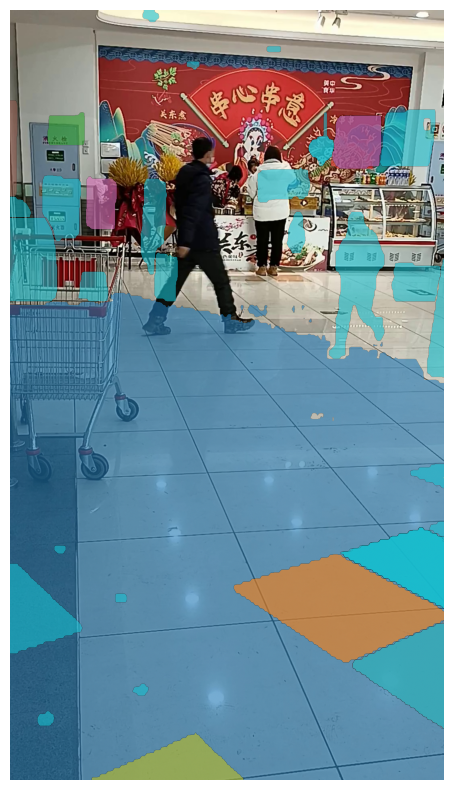

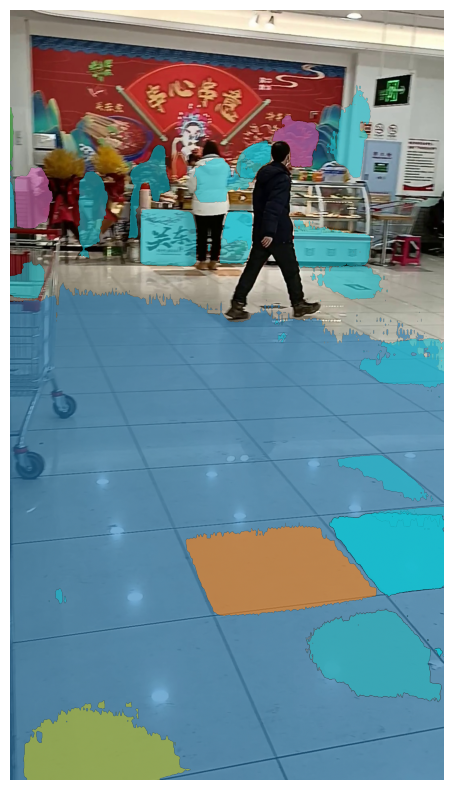

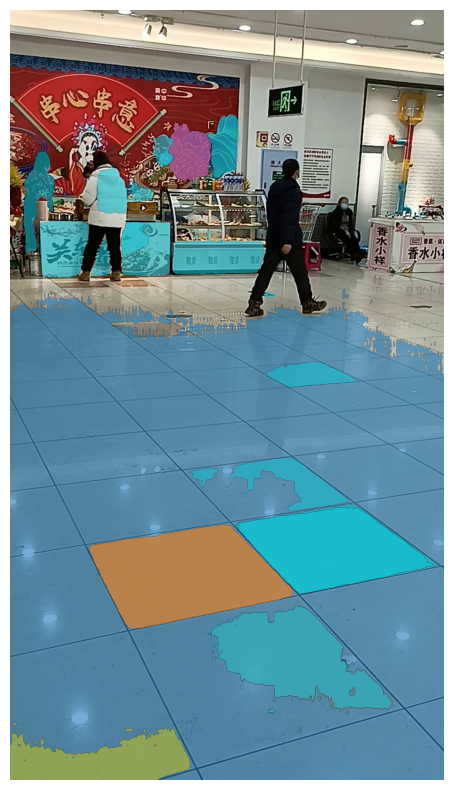

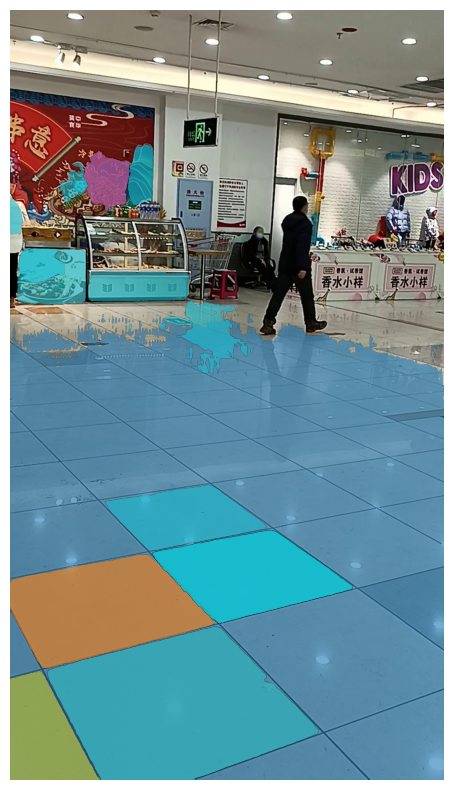

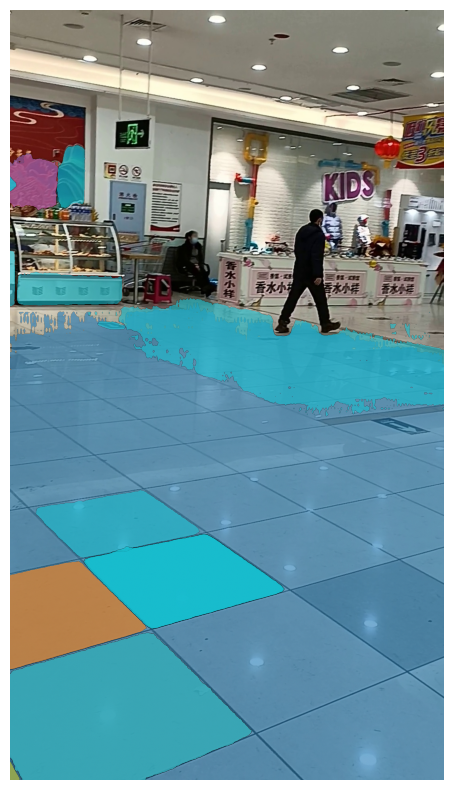

...

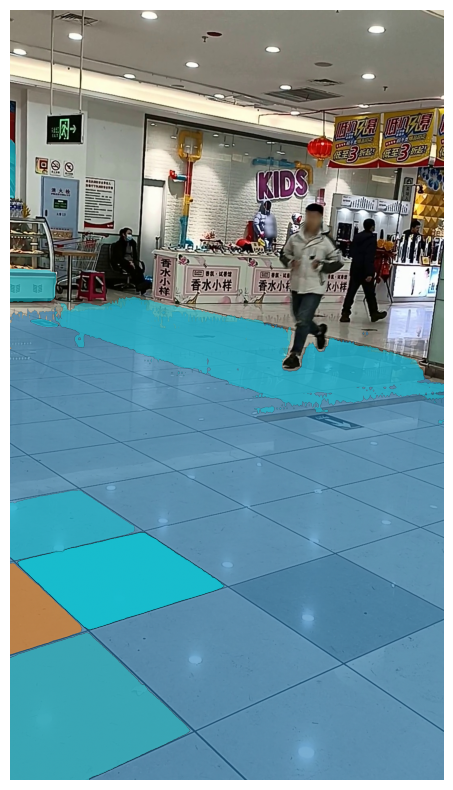

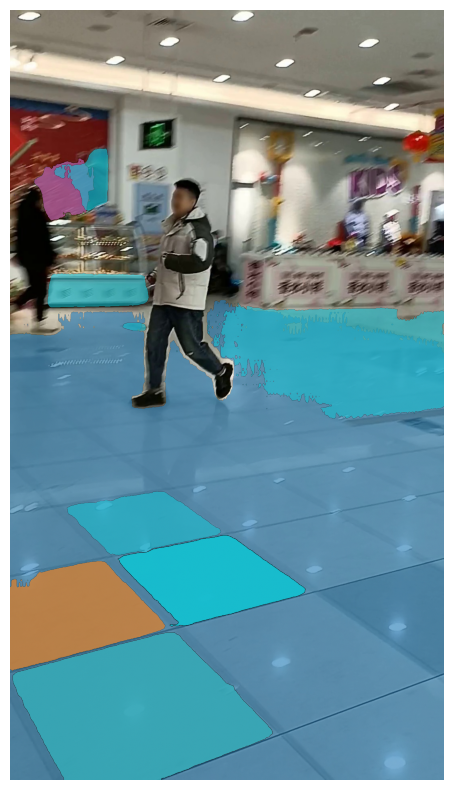

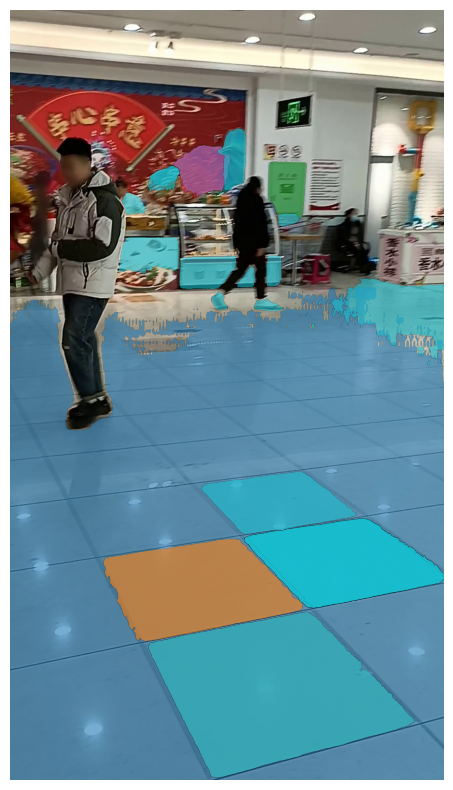

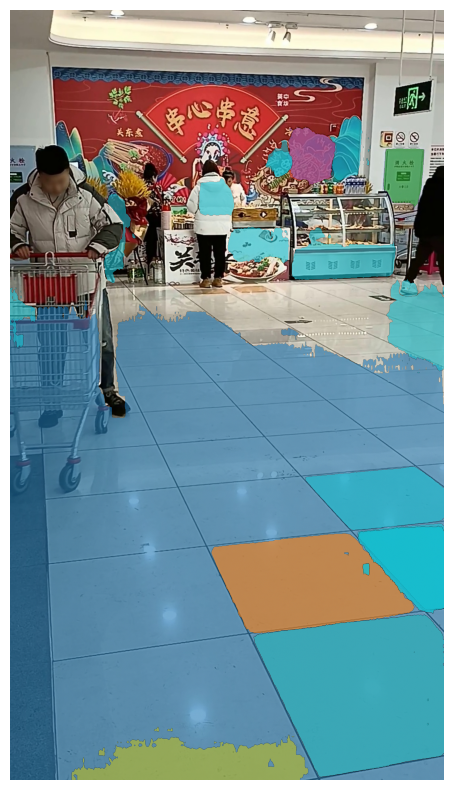

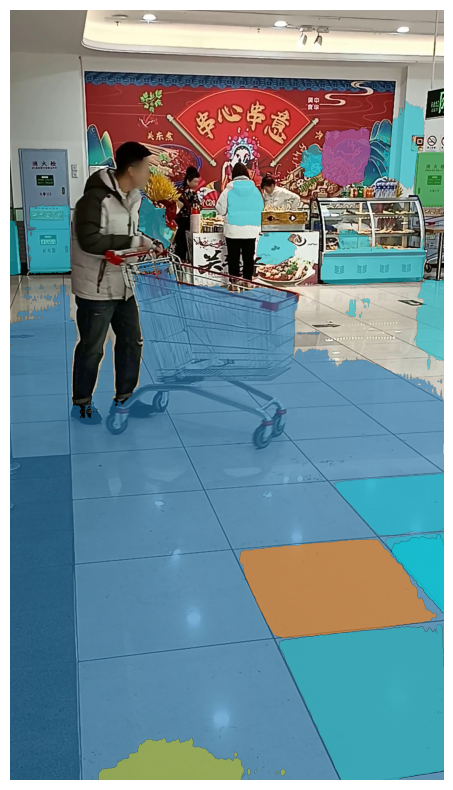

In [24]:
vis_frame_stride = 25
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(20, 10))
    plt.imshow(Image.open(os.path.join(sample_videos_GS2, frame_names[out_frame_idx])))
    plt.axis('off')
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        annotated_frame = show_mask(out_mask, plt.gca(), obj_id=out_obj_id)
        output_pth = "/mmfs1/gscratch/krishna/danielog/Project_vsg/Grounded-SAM-2/outputs/segment_all_objects/"
        plt.savefig(os.path.join(output_pth, f"annotated_frame_{out_frame_idx:05d}.jpg"))

In [ ]:
OUTPUT_VIDEO_PATH = "./sav_001224.mp4"
SAVE_TRACKING_RESULTS_DIR = "/mmfs1/gscratch/krishna/danielog/Project_vsg/Grounded-SAM-2/outputs/segment_all_objects"

create_video_from_images(SAVE_TRACKING_RESULTS_DIR, OUTPUT_VIDEO_PATH)